In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import spacy
import pycountry
import glob
import re

ocha_data_df = pd.read_csv('ocha_weighted_avg.csv')

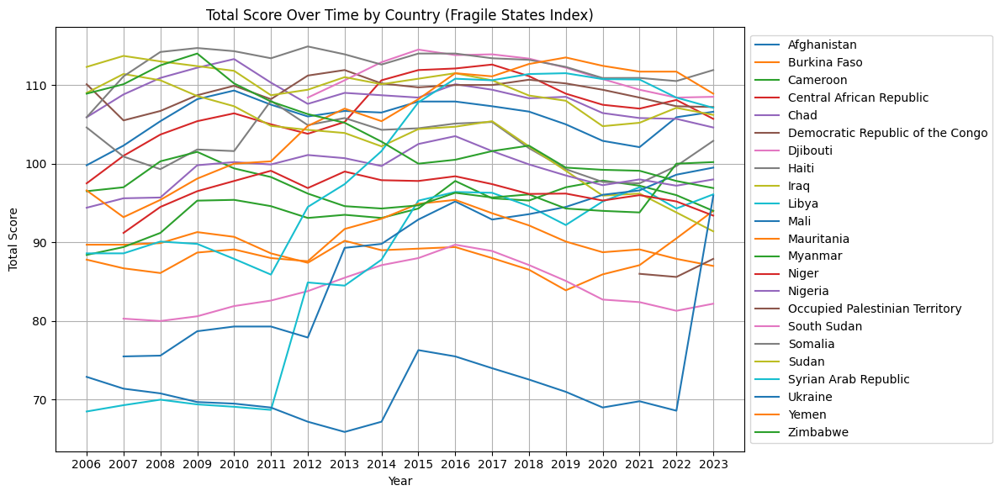

In [5]:
# compiling summary insights from the Fragile States Index #
import glob
import re

fsi_excel_files = sorted(glob.glob("Fragile States Index/fsi-*.xlsx")) 

# country level data alignment
country_data = {}
column_names = ['Total', 'C1: Security Apparatus',	'C2: Factionalized Elites',	'C3: Group Grievance',	'E1: Economy',	'E2: Economic Inequality',	'E3: Human Flight and Brain Drain',	'P1: State Legitimacy',	'P2: Public Services',	'P3: Human Rights',	'S1: Demographic Pressures',	'S2: Refugees and IDPs',	'X1: External Intervention']

# for loops to pull and merge data
for file in fsi_excel_files:
    # Extract the year using a regular expression
    match = re.search(r"(\d{4})", file)
    if match:
        year = int(match.group(1))
    else:
        print(f"Warning: Could not extract year from filename: {file}")
        continue  # Skip to the next file

    df = pd.read_excel(file)

    for index, row in df.iterrows():
        country = row['Country']
        if country not in country_data:
            country_data[country] = {}

        for col in column_names:
            country_data[country][f'{year}_{col}'] = row[col] 

# 3. Convert the dictionary to a DataFrame
fsi_final_df = pd.DataFrame.from_dict(country_data, orient='index')

# 4. Handle missing values (important!)
fsi_final_df = fsi_final_df.fillna(pd.NA) 

# 5. Save to a new Excel file
fsi_final_df.to_excel("interim_fsi_data.xlsx") 

# Plotting to test efficacy
plot_data = fsi_final_df.copy()

# Extract the '(year)_Total' columns
total_columns = [col for col in plot_data.columns if col.endswith("_Total")]
plot_data = plot_data[total_columns]

# Transpose the data for plotting
plot_data = plot_data.T  # Rows become years, columns become countries
plot_data.index = plot_data.index.map(lambda x: int(x.split("_")[0]))

# Filtering to target country set
country_name_mapping = {
    "Congo Democratic Republic": "Democratic Republic of the Congo",
    "Palestine": "Occupied Palestinian Territory",
    "Syria": "Syrian Arab Republic"
}
plot_data = plot_data.rename(columns=country_name_mapping)
target_countries = ['Afghanistan', 'Burkina Faso', 'Cameroon', 'Central African Republic', 'Chad', 'Democratic Republic of the Congo', 'Djibouti', 'Haiti', 'Iraq', 'Libya', 'Mali', 'Mauritania', 'Myanmar', 'Niger', 'Nigeria', 'Occupied Palestinian Territory', 'South Sudan', 'Somalia', 'Sudan', 'Syrian Arab Republic', 'Ukraine', 'Yemen', 'Zimbabwe']
plot_data_filtered = plot_data[target_countries]


# 8. Create the plot
plt.figure(figsize=(12, 6))

for country in plot_data_filtered.columns:  # Iterate over the filtered columns
    plt.plot(plot_data_filtered.index, plot_data_filtered[country], label=country)

plt.xlabel("Year")
plt.xticks(plot_data_filtered.index, plot_data_filtered.index.astype(int))
plt.ylabel("Total Score")
plt.title("Total Score Over Time by Country (Fragile States Index)")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid(True)
plt.tight_layout()
plt.show()

In [6]:
# compiling summary insights from the World Risk Index #

wri_csv_files = sorted(glob.glob("World Risk Index/worldriskindex-datasets/worldriskindex-*.csv")) 

# country level data alignment
wri_country_data = {}
wri_column_names = [
    'W', 'E', 'V', 'S', 'C', 'A', 
    'S_01', 'S_02', 'S_03', 'S_04', 'S_05', 
    'C_01', 'C_02', 'C_03', 
    'A_01', 'A_02', 'A_03', 
    'EI_01', 'EI_02', 'EI_03', 'EI_04', 'EI_05', 'EI_06', 'EI_07', 
    'SI_01', 'SI_02', 'SI_03', 'SI_04', 'SI_05', 'SI_06', 'SI_07', 'SI_08', 'SI_09', 'SI_10', 'SI_11', 'SI_12', 'SI_13', 'SI_14', 
    'CI_01', 'CI_02', 'CI_03', 'CI_04', 'CI_05', 'CI_06', 'CI_07', 
    'AI_01', 'AI_02', 'AI_03', 'AI_04'
]
# for loops to pull and merge data
for file in wri_csv_files:
    # Extract the year using a regular expression
    match = re.search(r"(\d{4})", file)
    if match:
        year = int(match.group(1))
    else:
        print(f"Warning: Could not extract year from filename: {file}")
        continue

    df = pd.read_csv(file)

    for index, row in df.iterrows():
        country = row['Country']
        if country not in wri_country_data:  # Use wri_country_data
            wri_country_data[country] = {}

        for col in wri_column_names:
            wri_country_data[country][f'{year}_{col}'] = row[col]

# Convert the dictionary to a DataFrame
wri_final_df = pd.DataFrame.from_dict(wri_country_data, orient='index')

wri_final_df = wri_final_df.fillna(pd.NA)
wri_final_df.to_excel("interim_wri_data.xlsx")


In [11]:
# cleaning the existing data #
inform_df = pd.read_csv('INFORM/inform2014_2023.csv')
ndgain_df = pd.read_csv('ND GAIN/resources/gain/gain.csv')

country_cross_df = pd.read_csv('country_code_crosswalk.csv')
wri_cross_df = pd.read_csv('worldrisk_code_cross.csv')

# translating from the coded country names - INFORM
def iso3_to_name(iso3_code):
    try:
        country = pycountry.countries.lookup(iso3_code)
        return country.name
    except LookupError:
        return None
inform_df['country_name'] = inform_df['Iso3'].apply(iso3_to_name)    

# reload of data to clean
interim_wri_df = pd.read_excel('interim_wri_data.xlsx')
interim_fsi_df = pd.read_excel('interim_fsi_data.xlsx')

# country name cleaning with spaCy
country_cleaner = {
    'Congo': 'Democratic Republic of the Congo',
    'Democratic Republic Congo': 'Democratic Republic of the Congo',
    'Congo Democratic': 'Democratic Republic of the Congo',
    'DR': 'Democratic Republic of the Congo',
    'DR Congo': 'Democratic Republic of the Congo',
    'DRC': 'Democratic Republic of the Congo',
    'Congo, the Democratic Republic o': 'Democratic Republic of the Congo',
    'Dem. Rep. of the Congo': 'Democratic Republic of the Congo',
    'Congo (DRC)': 'Democratic Republic of the Congo',
    'République démocratique du Congo': 'Democratic Republic of the Congo',
    'Congo-Kinshasa': 'Democratic Republic of the Congo',
    'Syria': 'Syrian Arab Republic',
    'Syrian Arab Rep.': 'Syrian Arab Republic',
    'Palestine':'Occupied Palestinian Territory',
    'Israel and West Bank':'Occupied Palestinian Territory',
    'Libyan Arab Jamahiriya':'Libya'
}

nlp = spacy.load("en_core_web_sm")
matcher = nlp.vocab.strings 

def standardize_country_name(text):
    doc = nlp(text)
    for ent in doc.ents:
        if ent.label_ == "GPE":
            if ent.text in country_cleaner:
                return country_cleaner[ent.text]
            else:
                # Handle "no match" with a fallback (e.g., return original)
                print(f"GPE found, but no match: {ent.text}") 
                return ent.text
    return text 

# Running the spaCy name cleaning on our dataframes
inform_df['Country'] = inform_df['country_name'].apply(standardize_country_name)
ndgain_df['Country'] = ndgain_df['Name'].apply(standardize_country_name)
interim_fsi_df['Country'] = interim_fsi_df['Country'].apply(standardize_country_name)
interim_wri_df['Country'] = interim_wri_df['Country'].apply(standardize_country_name)


# filtering our data by target countries
inform_filtered = inform_df[inform_df['Country'].isin(target_countries)]
ndgain_filtered = ndgain_df[ndgain_df['Country'].isin(target_countries)]
fsi_filtered = interim_fsi_df[interim_fsi_df['Country'].isin(target_countries)]
wri_filtered = interim_wri_df[interim_wri_df['Country'].isin(target_countries)]

GPE found, but no match: Afghanistan
GPE found, but no match: Angola
GPE found, but no match: Albania
GPE found, but no match: United Arab Emirates
GPE found, but no match: Argentina
GPE found, but no match: Australia
GPE found, but no match: Austria
GPE found, but no match: Azerbaijan
GPE found, but no match: Burundi
GPE found, but no match: Belgium
GPE found, but no match: Bangladesh
GPE found, but no match: Bulgaria
GPE found, but no match: Bahrain
GPE found, but no match: Bahamas
GPE found, but no match: Bosnia and Herzegovina
GPE found, but no match: Belize
GPE found, but no match: Estonia
GPE found, but no match: Ethiopia
GPE found, but no match: Finland
GPE found, but no match: Fiji
GPE found, but no match: France
GPE found, but no match: Federated States
GPE found, but no match: United Kingdom
GPE found, but no match: Georgia
GPE found, but no match: Ghana
GPE found, but no match: Guinea
GPE found, but no match: Gambia
GPE found, but no match: Equatorial Guinea
GPE found, but n

In [12]:
# splicing out our years of interest #
target_lag = [0,1,2,3,5]
target_year = 2022

# filter function based on years #
def lag_filter(df, target_year, target_lag, id_column='Country'):
    selected_columns = [id_column]
    for lag in target_lag:
        year = target_year - lag
        pattern = rf"^{year}_"

        matching_columns = [col for col in df.columns if re.match(pattern, col)]
        if matching_columns:
            selected_columns.extend(matching_columns)
        else:
            print(f"Warning: No columns found matching year {year}.")
            
    if selected_columns:
        return df[selected_columns]
    else:
        return pd.DataFrame() #Return empty dataframe if none are found.

# running on WRI, FSI
wri_lagfiltered_df = lag_filter(wri_filtered, target_year, target_lag)
fsi_lagfiltered_df = lag_filter(fsi_filtered, target_year, target_lag)

# confirming INFORM, ND-Gain
inform_filtered = inform_filtered[inform_filtered['country_name'] != 'Congo']

nd_reload = ndgain_df.copy()
name_correction = {
    "Congo, the Democratic Republic o": "Democratic Republic of the Congo",
    "Israel": "Occupied Palestinian Territory",
    'Libyan Arab Jamahiriya':'Libya'
}
nd_reload['Name'] = nd_reload['Name'].replace(name_correction)
ndgain_filtered = nd_reload[nd_reload['Name'].isin(target_countries)]
ndgain_filtered['Country'] = ndgain_filtered['Name']
ndgain_filtered = ndgain_filtered[ndgain_filtered['Name'] != 'Congo']

# INFORM data is in rows for year filtering
selected_inform_df = pd.DataFrame()
selected_rows = []
for lag in target_lag:
    year = target_year - lag
    filtered_rows = inform_filtered[inform_filtered['SurveyYear'] == year]
    selected_inform_df = pd.concat([selected_inform_df, filtered_rows], ignore_index=True)

# ND-Gain is in columns with the year as the title
years_to_keep = [target_year - lag for lag in target_lag]
years_as_strings = [str(year) for year in years_to_keep]
columns_to_keep = ['Country']
for col in ndgain_filtered.columns:
    try:
        col_year = str(int(col)) 
        if col_year in years_as_strings:
            columns_to_keep.append(col)
    except ValueError:
        pass 
selected_ndgain_df = ndgain_filtered.loc[:, columns_to_keep]

/var/folders/6y/z0315m514rx79r25lwyjx_d80000gn/T/ipykernel_63004/1528589114.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ndgain_filtered['Country'] = ndgain_filtered['Name']


In [13]:
# ocha data tweaks #

ocha_data_df['Year'] = pd.to_numeric(ocha_data_df['Year'], errors= 'coerce').astype('Int64').astype(str).str.strip()
ocha_years_to_keep = [str(target_year - lag) for lag in target_lag]
ocha_filtered = ocha_data_df[ocha_data_df['Year'].isin(ocha_years_to_keep)]

In [46]:
# Code for assigning datasets and chopping them #
assigned_people = {
    "ndgain":"SS",
    "FSI":"XL",
    "INFORM":"RH",
    "WRI":"PS"
}

ocha_filtered.to_excel("ALL_OCHA_data_lagged.xlsx")
selected_ndgain_df.to_excel("SS_NDGain_data_lagged.xlsx")
selected_inform_df.to_excel("RH_INFORM_data_lagged.xlsx")
fsi_lagfiltered_df.to_excel("XL_FSI_data_lagged.xlsx")
wri_lagfiltered_df.to_excel("PS_WRI_data_lagged.xlsx")
